# 1. Transform text data into 5 labels 
using LLama3

In [ ]:
import asyncio
import aiohttp
import pandas as pd
import json
import re
import csv
from pathlib import Path
import nest_asyncio
nest_asyncio.apply()

OLLAMA_URL = "http://localhost:11434/api/chat"
MODEL_NAME = "llama3"

dir = Path("a_new_data")
dir.mkdir(exist_ok=True)
input_file = dir / "metadata.csv"       
results_file = dir / "re_results.csv"        # all the results
complete_file = dir / "re_complete_rows.csv" # results with all the label values

def _coerce_to_str(v):
    if v is None:
        return ""
    if isinstance(v, (list, tuple)):
        return ", ".join([str(x) for x in v if x])
    if isinstance(v, (bool, int, float)):
        return str(v)
    return str(v)

def _try_sanitize_json(s: str) -> dict:
    s = s.strip().strip("`").strip()
    m = re.search(r"\{.*\}", s, flags=re.DOTALL)
    if not m:
        raise ValueError("No JSON object found")
    cand = m.group(0)
    cand = re.sub(r",\s*([}\]])", r"\1", cand)  
    return json.loads(cand)

# LLM prompt
async def extract_attributes(session, text):
    prompt = f"""
        You are a precise data cleaning and information extraction assistant for fashion product metadata.

        Extract the following attributes from the text below:
        - "color": list all color names mentioned (e.g., red, black, gold). If none, return an empty string.
        - "material": list all materials or fabrics (e.g., silk, cotton, denim, knit). If none, return an empty string.
        - "pattern": describe any visible or textual pattern (e.g., floral, striped, jacquard, plain). If none, return an empty string.

        Return ONLY a JSON object with exactly these keys:
        {{"color":"","material":"","pattern":""}}

        Text to analyze:
        {text}
        """.strip()

    payload = {
        "model": MODEL_NAME,
        "messages": [{"role": "user", "content": prompt}],
        "format": "json",               
        "options": {"temperature": 0},   
        "stream": False
    }

    last_err = None
    for attempt in range(3): 
        try:
            async with session.post(OLLAMA_URL, json=payload, timeout=300) as resp:
                data = await resp.json()
                raw = data.get("message", {}).get("content", "")
                try:
                    obj = json.loads(raw)         
                except Exception:
                    obj = _try_sanitize_json(raw)

                color    = _coerce_to_str(obj.get("color", ""))
                material = _coerce_to_str(obj.get("material", ""))
                pattern  = _coerce_to_str(obj.get("pattern", ""))
                return color, material, pattern
        except Exception as e:
            last_err = e
            await asyncio.sleep(0.8 * (attempt + 1))

    print(f"[extract_attributes] failed after retries: {last_err}")
    return "", "", ""

# write per row
async def process_and_write(df, results_path, complete_path, concurrency=5, batch_size=32):
    header = ["image_id", "category", "sub_category", "color", "material", "pattern"]
    with open(results_path, "w", newline="", encoding="utf-8") as rf, \
         open(complete_path, "w", newline="", encoding="utf-8") as cf:
        csv.writer(rf).writerow(header)
        csv.writer(cf).writerow(header)

    sem = asyncio.Semaphore(concurrency)
    connector = aiohttp.TCPConnector(limit=concurrency, limit_per_host=concurrency)
    async with aiohttp.ClientSession(connector=connector) as session:
        # batch process
        for start in range(0, len(df), batch_size):
            batch_df = df.iloc[start:start+batch_size].copy()

            async def bound_task(row):
                async with sem:
                    text = f"{row.get('url_name','')} {row.get('description','')} {row.get('title','')}"
                    color, material, pattern = await extract_attributes(session, text)
                    return (
                        row.get("image_id", ""),
                        row.get("category", ""),
                        row.get("sub_category", ""),
                        color, material, pattern
                    )

            tasks = [bound_task(row) for _, row in batch_df.iterrows()]
            results = await asyncio.gather(*tasks)  

            with open(results_path, "a", newline="", encoding="utf-8") as rf, \
                 open(complete_path, "a", newline="", encoding="utf-8") as cf:
                w_all = csv.writer(rf)
                w_ok  = csv.writer(cf)
                for rec in results:
                    w_all.writerow(rec)
                    print("ROW:", rec)

                    # write into complete_rows.csv when all three cloumms has value
                    if all(str(rec[i]).strip() != "" for i in (3,4,5)):
                        w_ok.writerow(rec)

def main():
    df = pd.read_csv(input_file)
    loop = asyncio.get_event_loop()
    loop.run_until_complete(
        process_and_write(
            df,
            results_path=results_file,
            complete_path=complete_file,
            concurrency=5,    
            batch_size=32    
        )
    )

    print(f"✅ streaming write done\n- {results_file}\n- {complete_file}")

if __name__ == "__main__":
    main()

ROW: (211990161, 'tops', 'tunic', 'nan', 'chiffon', 'print')
ROW: (183179503, 'bottoms', 'pants', 'Gold, Black', 'Silk Blend, Viscose, Polyester, Polyamide', 'Floral Jacquard')
ROW: (152771755, 'jewellery', 'ring', '', 'stainless steel', '')
ROW: (190445143, 'bottoms', 'pants', 'gold', 'knit', 'Decorative')
ROW: (211444470, 'bottoms', 'shorts', '', '', '')
ROW: (192704091, 'shoes', 'heels', 'red', 'patent leather, denim', 'bow')
ROW: (117334561, 'outerwear', 'cardigan', 'nan', 'cable knit', 'plain')
ROW: (127403908, 'outerwear', 'trench coat', 'pink', 'woolen polyester', 'plain')
ROW: (149817672, 'tops', 'sweater', 'Black', 'cashmere', '')
ROW: (210309753, 'jewellery', 'bracelet', '', '', '')
ROW: (150379320, 'scarves', 'scarf', 'cherry', '', '')
ROW: (182043322, 'tops', 'tank', '', '', '')
ROW: (210244384, 'accessories ', 'sunglasses', 'two-tone', '', 'butterfly')
ROW: (120679156, 'scarves', 'scarf', 'black', '', 'checkered')
ROW: (184924381, 'tops', 'sweathirt', 'nan', '', 'loose let

# 2. Clean data

In [ ]:
# (1) change into lower case
# (2) remove "/" into ","
# (3) remove 100% or any thing similar
# (4) remove nan
# (5) check and delete rows with no all the columns

"""
Clean 're_complete_rows.csv' according to the requested rules:

(1) Lowercase everything (except image_id stays as-is but is read as string to preserve leading zeros if any)
(2) Replace "/" with "," (CSV writer will quote fields that contain commas)
(3) Remove tokens like "100%" or any "<number>%", including "100 %"
(4) Remove literal 'nan' tokens (case-insensitive) wherever they appear in a field
    - If a field becomes empty after removal, leave it empty
(5) Drop any row where any of the 6 columns are empty after cleaning

Notes:
- We DO NOT convert spaces to commas. We only replace "/" with "," per your rule.
- We normalize redundant delimiters (e.g., ", ,", duplicate commas, excess spaces).
- Columns are enforced to: image_id, category, sub_category, color, material, pattern
"""

from pathlib import Path
import pandas as pd
import re

# --------------------------------------------------------------------
# Paths (as provided)
# --------------------------------------------------------------------
dir = Path("a_new_data")
in_path  = dir / "re_complete_rows.csv"
out_path = dir / "label_complete.csv"

# --------------------------------------------------------------------
# Helpers
# --------------------------------------------------------------------
PERCENT_RE = re.compile(r"\b\d+\s*%")        # matches 100%, 95 %, etc.
NAN_WORD_RE = re.compile(r"\bnan\b", re.IGNORECASE)  # matches 'nan' as a whole word
MULTI_COMMAS_RE = re.compile(r",\s*,+")      # collapse consecutive commas
SPACE_AROUND_COMMA_RE = re.compile(r"\s*,\s*")  # normalize spaces around commas

def clean_field(val: str) -> str:
    """
    Apply the required cleaning steps to a single field (string).
    Order matters to avoid leaving behind awkward punctuation or spaces.
    """
    if val is None:
        return ""

    # Coerce to string, strip outer whitespace
    s = str(val).strip()

    # Lowercase
    s = s.lower()

    # Replace '/' with ',' (rule 2)
    s = s.replace("/", ",")

    # Remove percentage tokens like '100%' or '100 %' (rule 3)
    s = PERCENT_RE.sub("", s)

    # Remove literal 'nan' tokens (rule 4)
    # Do this before comma/space normalization so we can clean up leftovers.
    s = NAN_WORD_RE.sub("", s)

    # Normalize spaces: collapse multiple spaces to single
    s = re.sub(r"\s+", " ", s)

    # If the field uses commas as a list separator, normalize comma spacing.
    #  - Remove spaces around commas
    s = SPACE_AROUND_COMMA_RE.sub(",", s)

    # After removals, there may be extra commas. Collapse duplicate commas: ",,," -> ","
    s = MULTI_COMMAS_RE.sub(",", s)
    s = re.sub(r",,", ",", s)

    # Trim leading/trailing commas/spaces once more
    s = s.strip(" ,")

    return s

# --------------------------------------------------------------------
# Load
# --------------------------------------------------------------------
# Important: keep_default_na=False and na_filter=False so the literal string "nan" is not auto-converted to NaN.
# We'll handle 'nan' ourselves per rule (4).
df = pd.read_csv(in_path, keep_default_na=False, na_filter=False, dtype=str)

# --------------------------------------------------------------------
# Enforce column order and existence
# --------------------------------------------------------------------
expected_cols = ["image_id", "category", "sub_category", "color", "material", "pattern"]
missing = [c for c in expected_cols if c not in df.columns]
if missing:
    raise ValueError(f"Input is missing required columns: {missing}. Found: {list(df.columns)}")

df = df[expected_cols].copy()

# --------------------------------------------------------------------
# Clean
# --------------------------------------------------------------------
# Clean every column except image_id the same way; for image_id we keep as-is but strip spaces.
df["image_id"] = df["image_id"].astype(str).str.strip()

for col in ["category", "sub_category", "color", "material", "pattern"]:
    df[col] = df[col].map(clean_field)

# --------------------------------------------------------------------
# Rule (5): drop rows with any empty value across the 6 columns *after* cleaning
# --------------------------------------------------------------------
# Define emptiness as an empty string "" after cleaning/stripping.
row_is_complete = (df[expected_cols] != "").all(axis=1)
df_clean = df.loc[row_is_complete].copy()

# --------------------------------------------------------------------
# Save
# --------------------------------------------------------------------
# index=False to avoid an extra column
# quoting is handled automatically (fields with commas will be quoted)
out_path.parent.mkdir(parents=True, exist_ok=True)
df_clean.to_csv(out_path, index=False)

In [1]:
import pandas as pd
from pathlib import Path

dir = Path("a_new_data")
out_path = dir / "label_complete.csv"
df = pd.read_csv(out_path)
print("Number of rows:", len(df))

Number of rows: 35990


# 3. EDA

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from collections import Counter

dir_path = Path("a_new_data")
csv_path = dir_path / "label_complete.csv"  
df = pd.read_csv(csv_path, dtype=str, keep_default_na=False)

print("=== Dataset Overview ===")
print(f"Rows: {len(df)}, Columns: {len(df.columns)}\n")
print("Columns:", list(df.columns))
print("\nSample rows:")
print(df.head())

=== Dataset Overview ===
Rows: 35990, Columns: 6

Columns: ['image_id', 'category', 'sub_category', 'color', 'material', 'pattern']

Sample rows:
    image_id   category sub_category       color  \
0  183179503    bottoms        pants  gold,black   
1  190445143    bottoms        pants        gold   
2  192704091      shoes        heels         red   
3  127403908  outerwear  trench coat        pink   
4  190235023       bags        purse  light blue   

                                 material          pattern  
0  silk blend,viscose,polyester,polyamide  floral jacquard  
1                                    knit       decorative  
2                    patent leather,denim              bow  
3                        woolen polyester            plain  
4                              pu leather        stitching  


In [4]:
print("\n=== Data Info ===")
print(df.info())

print("\n=== Missing/Empty Value Counts ===")
print((df == "").sum())

print("\n=== Duplicate image_id check ===")
duplicates = df[df["image_id"].duplicated(keep=False)]
print(f"Duplicate rows: {len(duplicates)}")
if len(duplicates) > 0:
    print(duplicates)


print("\n=== Summary ===")
print(f"Total rows: {len(df)}")
print(f"Empty values per column:\n{(df == '').sum()}")


=== Data Info ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35990 entries, 0 to 35989
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image_id      35990 non-null  object
 1   category      35990 non-null  object
 2   sub_category  35990 non-null  object
 3   color         35990 non-null  object
 4   material      35990 non-null  object
 5   pattern       35990 non-null  object
dtypes: object(6)
memory usage: 1.6+ MB
None

=== Missing/Empty Value Counts ===
image_id        0
category        0
sub_category    0
color           0
material        0
pattern         0
dtype: int64

=== Duplicate image_id check ===
Duplicate rows: 0

=== Summary ===
Total rows: 35990
Empty values per column:
image_id        0
category        0
sub_category    0
color           0
material        0
pattern         0
dtype: int64


In [5]:
print("\n=== Unique values per column ===")
for col in df.columns[:3]:
    print(f"{col}: {df[col].nunique()} unique values")


=== Unique values per column ===
image_id: 35990 unique values
category: 10 unique values
sub_category: 99 unique values


In [6]:
multi_cols = ["color", "material", "pattern"]

def explode_multi_value(series: pd.Series, lowercase=False):
    vals = []
    for cell in series.fillna(""):
        for token in str(cell).split(","):
            t = token.strip()
            if not t:
                continue
            vals.append(t.lower() if lowercase else t)
    return pd.Series(vals, dtype="string")
label_library = {}
for col in multi_cols:
    exploded = explode_multi_value(df[col], lowercase=False)
    label_library[col] = sorted(exploded.dropna().unique().tolist())

print("=== Unique values ===")
for col in multi_cols:
    print(f"{col}: {len(label_library[col])} unique")

=== Unique values ===
color: 2654 unique
material: 2826 unique
pattern: 8162 unique



=== Category Frequency ===
category
tops           8824
bottoms        7824
shoes          7006
bags           4682
outerwear      2732
all-body       2019
jewellery       856
accessories     832
hats            654
scarves         561
Name: count, dtype: int64


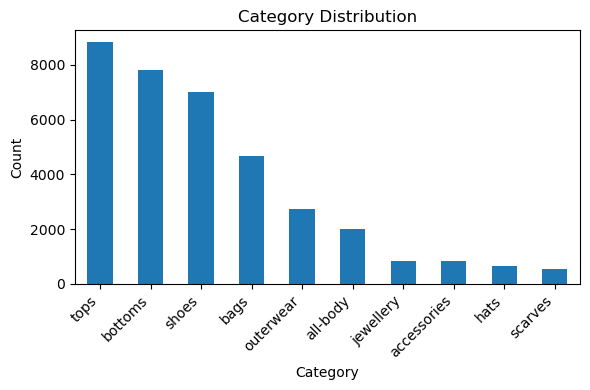


=== Sub-category Frequency ===
sub_category
sweater             4479
skirt               3353
heels               3033
purse               2615
dress               1713
                    ... 
brooch                 1
male track pants       1
set                    1
messenger bag          1
male polos             1
Name: count, Length: 99, dtype: int64


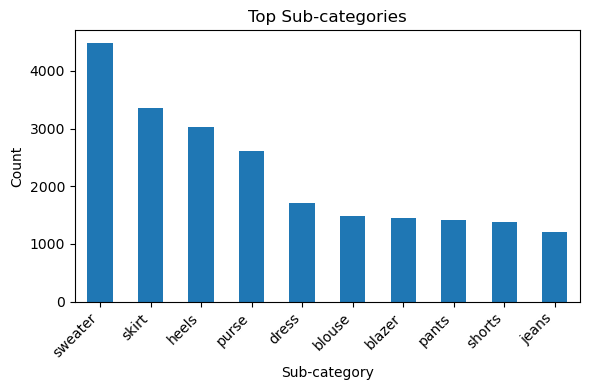

In [8]:
print("\n=== Category Frequency ===")
print(df["category"].value_counts())

plt.figure(figsize=(6, 4))
df["category"].value_counts().plot(kind="bar")
plt.title("Category Distribution")
plt.ylabel("Count")
plt.xlabel("Category")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

print("\n=== Sub-category Frequency ===")
print(df["sub_category"].value_counts())

plt.figure(figsize=(6, 4))
df["sub_category"].value_counts().head(10).plot(kind="bar")
plt.title("Top Sub-categories")
plt.ylabel("Count")
plt.xlabel("Sub-category")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


=== COLOR Frequency ===
black     11468
gold       3260
white      2901
blue       1917
red        1623
pink       1016
denim       817
grey        700
green       619
yellow      569
Name: count, dtype: int64


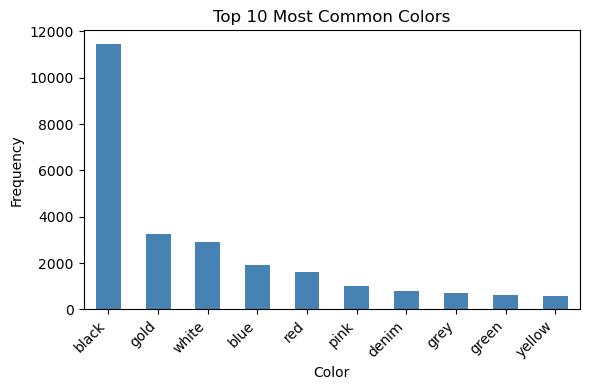


=== MATERIAL Frequency ===
leather         6639
cotton          5005
polyester       3158
silk            2495
denim           2226
suede           1602
wool            1397
elastane        1280
viscose         1039
faux leather     872
Name: count, dtype: int64


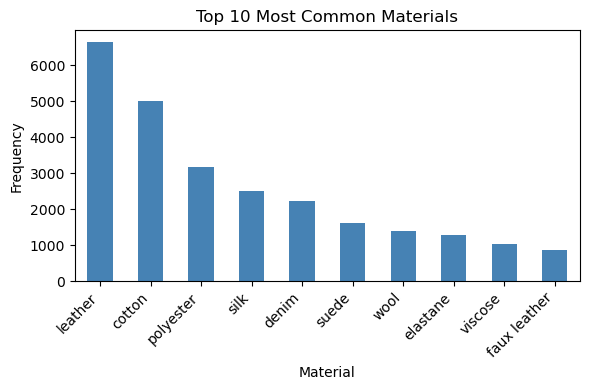


=== PATTERN Frequency ===
plain          5674
striped        1866
floral         1215
printed         975
embroidered     871
pleated         519
studded         434
embellished     426
distressed      400
plaid           400
Name: count, dtype: int64


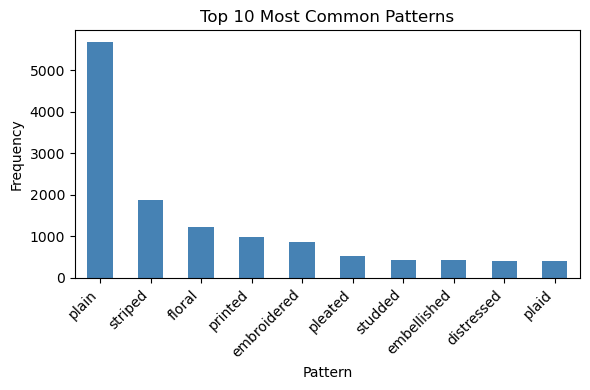

In [10]:
def split_and_flatten(series):
    """Split comma-separated values and flatten into a list"""
    values = []
    for val in series:
        if isinstance(val, str) and val.strip() != "":
            for token in val.split(","):
                t = token.strip().lower()
                if t:
                    values.append(t)
    return pd.Series(values)

# Columns of interest
multi_cols = ["color", "material", "pattern"]

for col in multi_cols:
    freq_series = split_and_flatten(df[col]).value_counts()
    print(f"\n=== {col.upper()} Frequency ===")
    print(freq_series.head(10))

    # Plot frequency
    plt.figure(figsize=(6, 4))
    freq_series.head(10).plot(kind="bar", color="steelblue")
    plt.title(f"Top 10 Most Common {col.capitalize()}s")
    plt.ylabel("Frequency")
    plt.xlabel(col.capitalize())
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

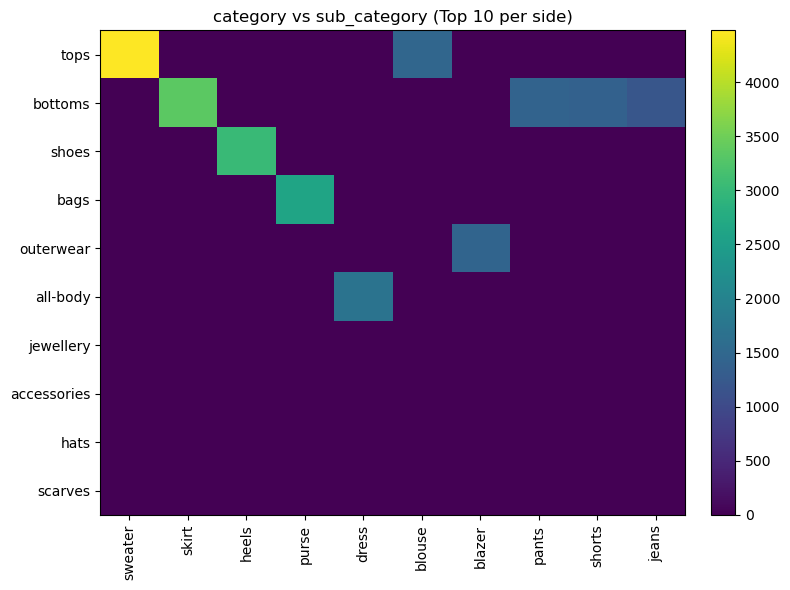

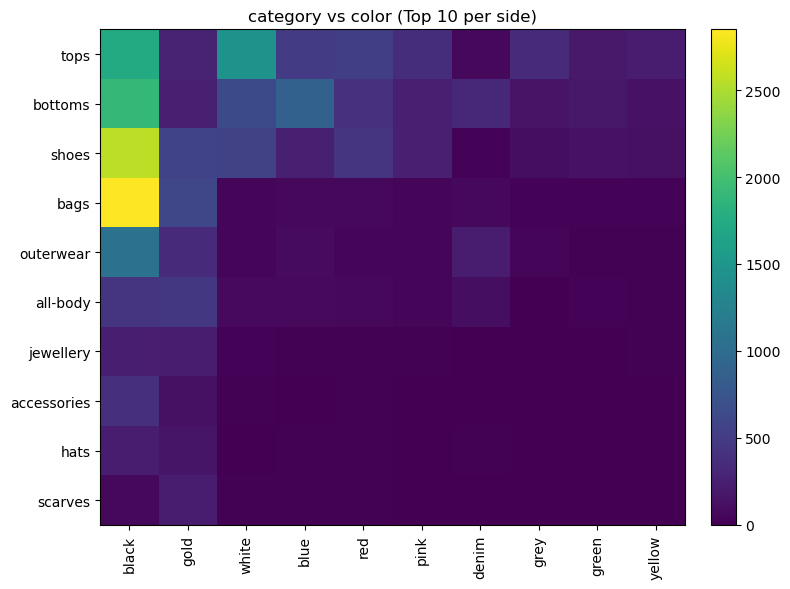

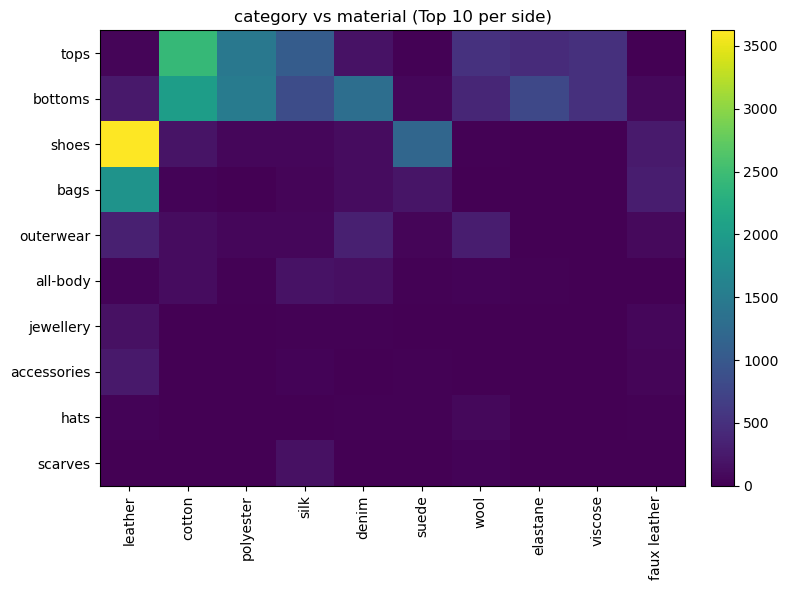

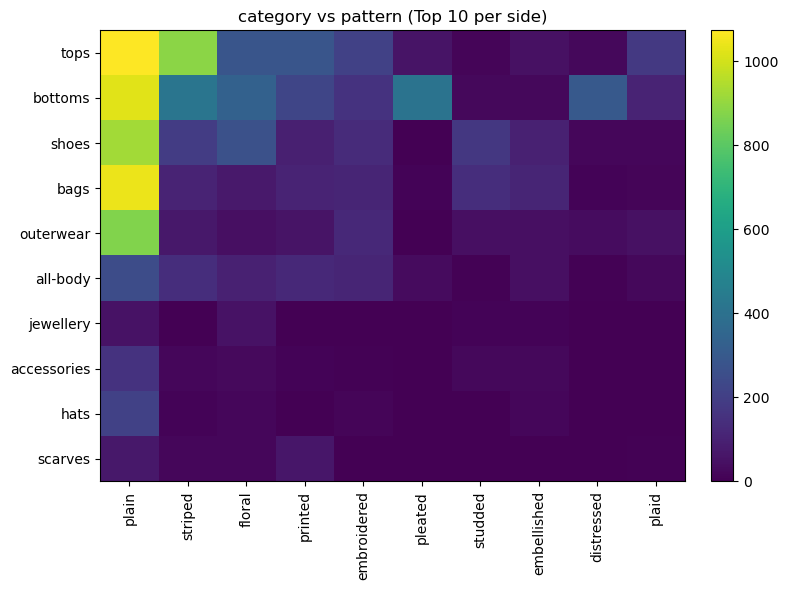

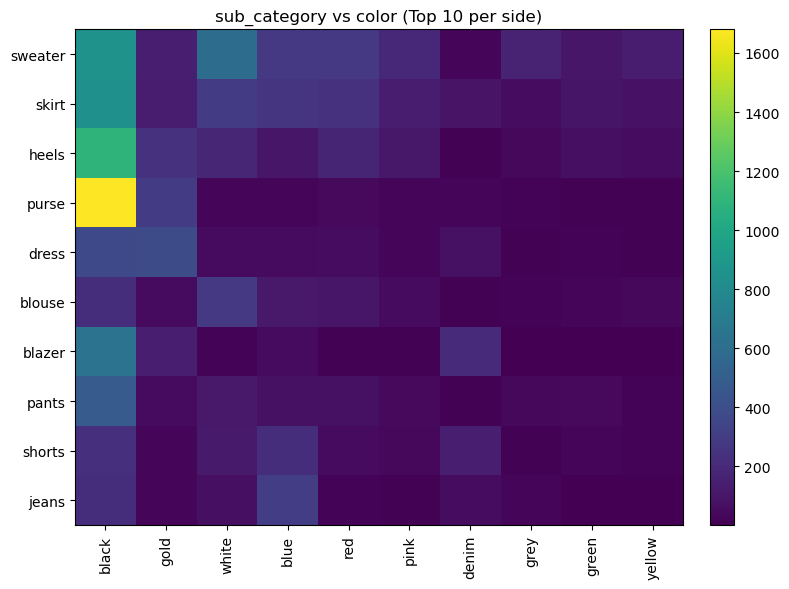

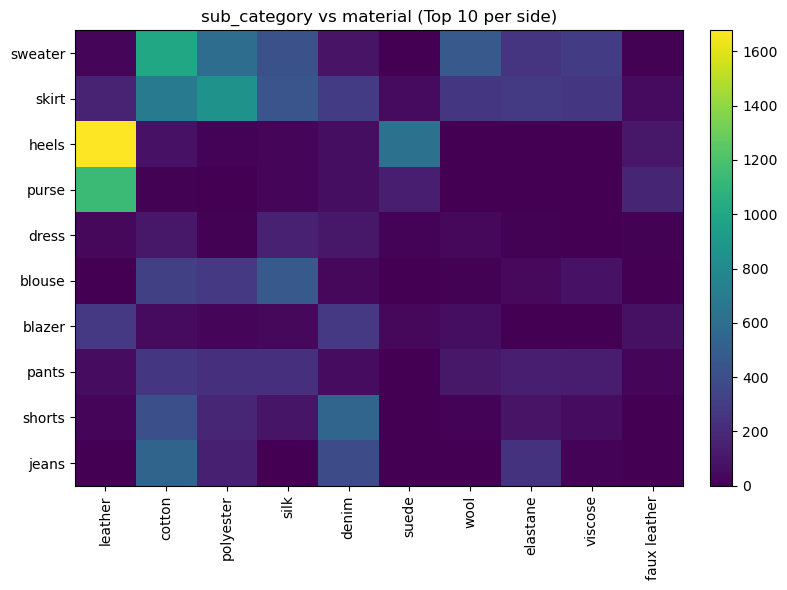

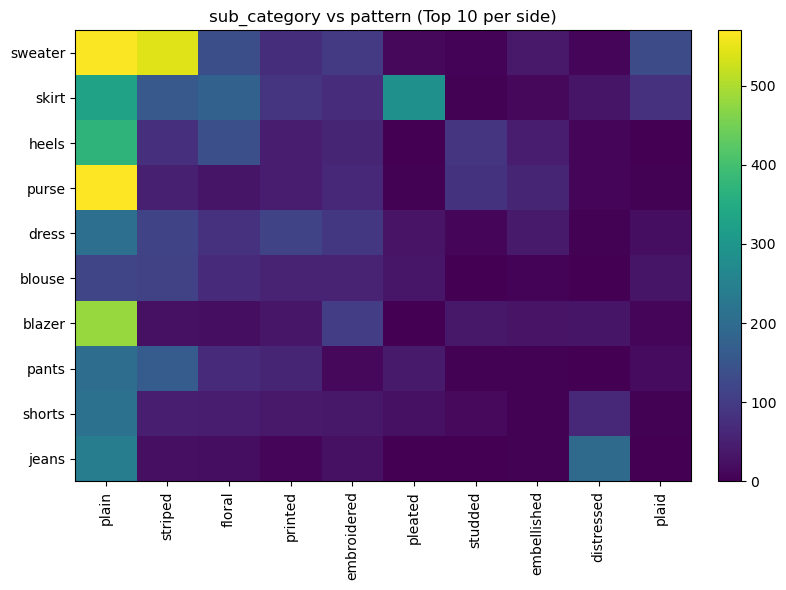

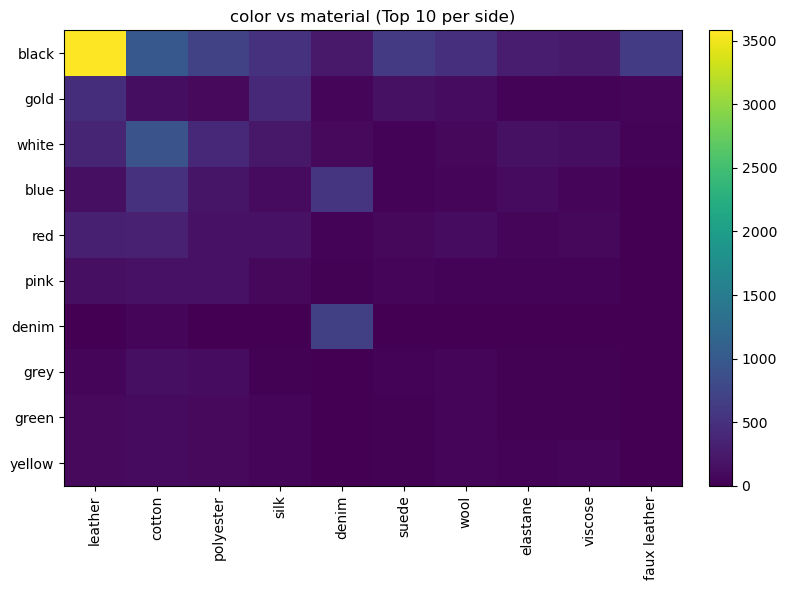

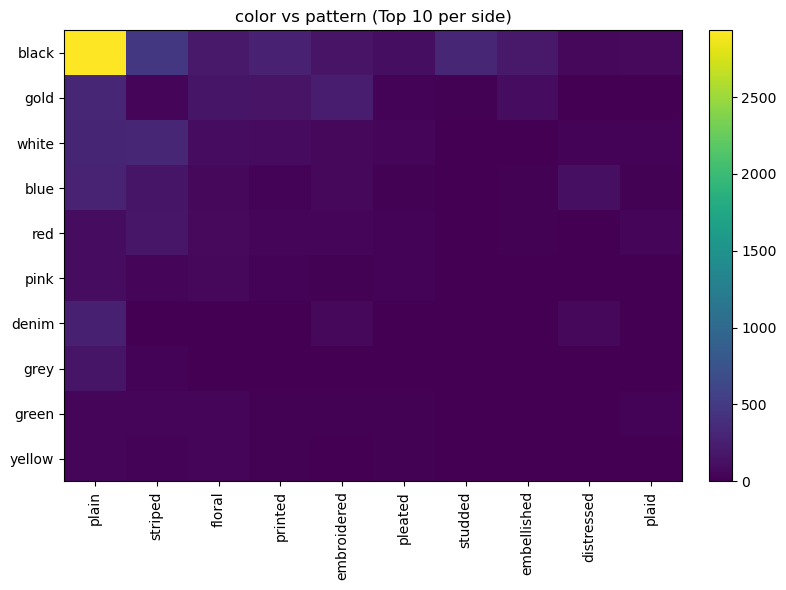

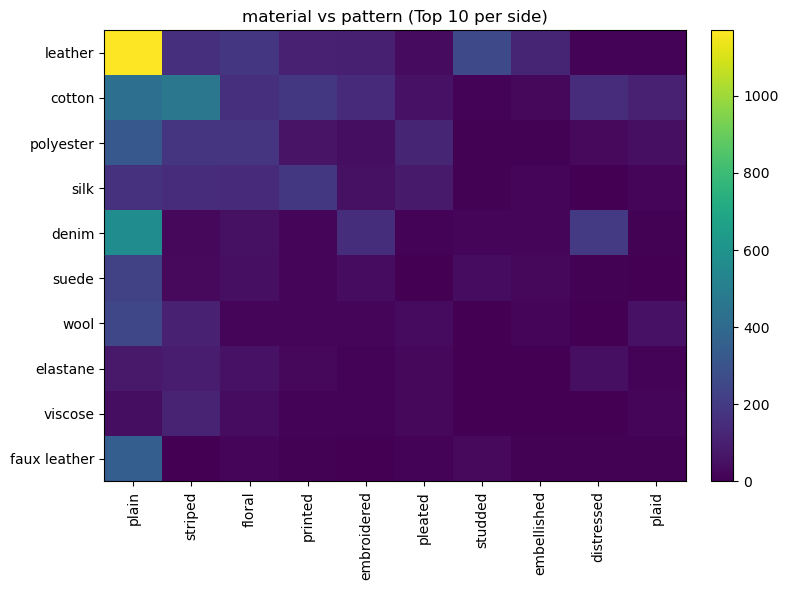

In [16]:
# correlation heat map
import os, json
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import combinations

# ----- CONFIG -----
DIR = Path("a_new_data")
CSV = DIR / "label_complete.csv"
TOP_K = 10
DELIMS = ["|", ","]  # preferred order for splitting when not JSON list

# ----- Load -----
df = pd.read_csv(CSV, dtype=str, keep_default_na=False)

# Exclude image_id if present
label_cols = [c for c in df.columns if c != "image_id"]
if not label_cols:
    raise ValueError("No label columns found after excluding 'image_id'.")

# ----- Helpers -----
def parse_cell_to_tokens(cell: str) -> list:
    """Parse a cell into a list of tokens.
       Priority: JSON list -> split by '|' -> split by ',' -> single token."""
    if cell is None:
        return []
    s = str(cell).strip()
    if s == "" or s.lower() == "nan":
        return []
    # JSON list?
    try:
        v = json.loads(s)
        if isinstance(v, list):
            return [str(t).strip() for t in v if str(t).strip()]
    except Exception:
        pass
    # Fallbacks by delimiter
    for d in DELIMS:
        if d in s:
            return [t.strip() for t in s.split(d) if t.strip()]
    # Single token
    return [s]

def top_k_tokens(series: pd.Series, k: int) -> list:
    """Return top-k tokens by frequency across the column (after tokenization)."""
    counts = {}
    for cell in series.astype(str):
        for tok in parse_cell_to_tokens(cell):
            if tok:
                counts[tok] = counts.get(tok, 0) + 1
    # sort by count desc, then token asc for stability
    toks_sorted = sorted(counts.items(), key=lambda x: (-x[1], x[0]))
    return [t for t, _ in toks_sorted[:k]]

def build_cooccurrence(series_a: pd.Series, series_b: pd.Series,
                       toks_a: list, toks_b: list) -> np.ndarray:
    """Build co-occurrence counts: rows=toks_a, cols=toks_b."""
    idx_a = {t: i for i, t in enumerate(toks_a)}
    idx_b = {t: j for j, t in enumerate(toks_b)}
    M = np.zeros((len(toks_a), len(toks_b)), dtype=np.int64)
    for ca, cb in zip(series_a.astype(str), series_b.astype(str)):
        set_a = set(parse_cell_to_tokens(ca))
        set_b = set(parse_cell_to_tokens(cb))
        if not set_a or not set_b:
            continue
        for ta in set_a:
            ia = idx_a.get(ta)
            if ia is None: 
                continue
            for tb in set_b:
                jb = idx_b.get(tb)
                if jb is None:
                    continue
                M[ia, jb] += 1
    return M

def plot_heatmap(mat: np.ndarray, y_labels: list, x_labels: list, title: str):
    plt.figure(figsize=(8, 6))
    im = plt.imshow(mat, aspect="auto", interpolation="nearest")
    plt.colorbar(im, fraction=0.046, pad=0.04)

    # axis ticks
    plt.xticks(ticks=np.arange(len(x_labels)), labels=[s[:20] for s in x_labels], rotation=90)
    plt.yticks(ticks=np.arange(len(y_labels)), labels=[s[:20] for s in y_labels])

    plt.title(title)
    plt.tight_layout()

# ----- Precompute top-10 per column -----
top_tokens_per_col = {}
for col in label_cols:
    toks = top_k_tokens(df[col], TOP_K)
    if len(toks) == 0:
        # fallback: keep a placeholder so we can still render an empty map if needed
        toks = []
    top_tokens_per_col[col] = toks

# ----- Generate heatmaps for every column pair -----
pairs = list(combinations(label_cols, 2))
for col_a, col_b in pairs:
    toks_a = top_tokens_per_col[col_a]
    toks_b = top_tokens_per_col[col_b]

    # Skip pairs where one side has no tokens
    if len(toks_a) == 0 or len(toks_b) == 0:
        print(f"Skip {col_a} vs {col_b}: no tokens after top-k filtering.")
        continue

    M = build_cooccurrence(df[col_a], df[col_b], toks_a, toks_b)
    title = f"{col_a} vs {col_b} (Top {TOP_K} per side)"
    plot_heatmap(M, toks_a, toks_b, title)


In [11]:
# 7) Length checks and simple heuristics
print("\n=== Average token counts per multi-label column ===")
def avg_token_count(series: pd.Series) -> float:
    counts = series.fillna("").map(lambda s: len([t for t in s.split(",") if t.strip() != ""]))
    return counts.mean()

print(f"Avg colors per row: {avg_token_count(df['color']):.2f}")
print(f"Avg materials per row: {avg_token_count(df['material']):.2f}")
print(f"Avg patterns per row: {avg_token_count(df['pattern']):.2f}")


=== Average token counts per multi-label column ===
Avg colors per row: 1.15
Avg materials per row: 1.39
Avg patterns per row: 1.04


=== Average number of labels per column ===
color: 1.15
material: 1.39
pattern: 1.04

=== Maximum number of labels found per column ===
color: 9
material: 9
pattern: 7

Largest multilabel count across all columns: 9
Row(s) with the largest multilabel count:
        image_id   category sub_category  \
8832   115053359    bottoms        skirt   
16892  186437907       tops      sweater   
18335  116511103       tops       hoodie   
18361   86609574       tops      sweater   
21939   57749000  outerwear       blazer   
29262  158680507    bottoms        skirt   
29670  166322500    bottoms        skirt   
31098  189438164       tops      sweater   

                                                   color  \
8832                                               black   
16892                              gold,tonal-blue,black   
18335                                           gunmetal   
18361                                              black   
21939                                  yellow

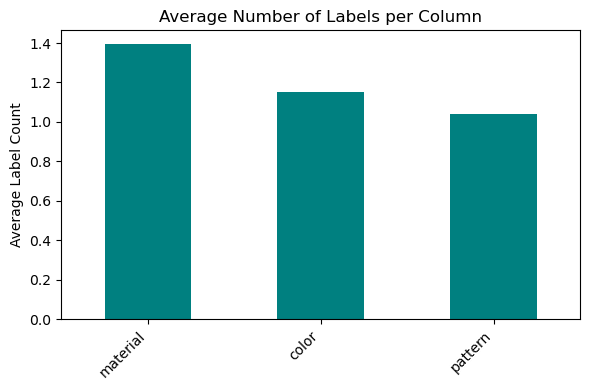

In [12]:
# 1) Function to count how many labels each row has per column
def count_labels(series: pd.Series) -> pd.Series:
    """
    Count how many comma-separated labels exist in each row of a Series.
    Empty or whitespace-only rows count as 0.
    """
    return series.fillna("").apply(
        lambda x: len([t for t in x.split(",") if t.strip() != ""])
    )

# Columns that may have multilabels
multi_cols = ["color", "material", "pattern"]

# 2) Calculate counts for each multilabel column
label_counts = pd.DataFrame({col: count_labels(df[col]) for col in multi_cols})
label_counts["max_labels"] = label_counts.max(axis=1)  # max among the columns per row

print("=== Average number of labels per column ===")
for col in multi_cols:
    print(f"{col}: {label_counts[col].mean():.2f}")

print("\n=== Maximum number of labels found per column ===")
for col in multi_cols:
    print(f"{col}: {label_counts[col].max()}")

# 3) Identify which row(s) have the largest multilabel count
# Overall largest across all multilabel columns
max_total = label_counts["max_labels"].max()
rows_with_max = df[label_counts["max_labels"] == max_total]

print(f"\nLargest multilabel count across all columns: {max_total}")
print("Row(s) with the largest multilabel count:")
print(rows_with_max[["image_id", "category", "sub_category", "color", "material", "pattern"]])

# Summary visualization
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
label_counts[multi_cols].mean().sort_values(ascending=False).plot(kind="bar", color="teal")
plt.title("Average Number of Labels per Column")
plt.ylabel("Average Label Count")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


# Find match images

In [13]:
# Match images where the filename (stem) == image_id
# - Scans images directory once and builds a stem→path index
# - Maps each CSV image_id to its path (exact filename match, any common image ext)
# - Reports found/missing/duplicates and saves an annotated CSV

from pathlib import Path
import pandas as pd

dir_path = Path("a_new_data")
csv_path = dir_path / "label_complete.csv"
images_dir = Path("polyvore_outfits") / "images"  

# Load data
df = pd.read_csv(csv_path, dtype=str, keep_default_na=False)
if "image_id" not in df.columns:
    raise ValueError("Column 'image_id' not found in the CSV.")

df["image_id"] = df["image_id"].astype(str).str.strip()

# ---------------------------------------------------------------------
# Build a filename index: stem (without extension) → list of Paths
# This honors your rule: filename (not including extension) == image_id.
# ---------------------------------------------------------------------
IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".webp", ".gif", ".bmp", ".tif", ".tiff"}

if not images_dir.exists():
    raise FileNotFoundError(f"Images directory not found: {images_dir.resolve()}")

stem_to_paths = {}
for p in images_dir.rglob("*"):
    if p.is_file() and p.suffix.lower() in IMAGE_EXTS:
        stem_to_paths.setdefault(p.stem, []).append(p)

# Map each image_id to path
match_counts = []
primary_path = []
all_matches = []

for img_id in df["image_id"]:
    hits = stem_to_paths.get(img_id, [])
    match_counts.append(len(hits))
    primary_path.append("" if not hits else str(hits[0]))
    all_matches.append([str(h) for h in hits])

df["image_match_count"] = match_counts
df["image_path"] = primary_path          # first match (or "")
df["image_matches"] = all_matches        # list of all matches (if any)

# Report
total = len(df)
found = (df["image_match_count"] > 0).sum()
missing = total - found
dupes = (df["image_match_count"] > 1).sum()

print(f"Total rows: {total}")
print(f"Found images: {found}")
print(f"Missing images: {missing}")
print(f"Rows with duplicate matches: {dupes}")

if missing:
    print("\nSample missing image_id (up to 20):")
    print(df.loc[df["image_match_count"] == 0, "image_id"].head(20).tolist())

if dupes:
    print("\nSample duplicate-matched image_id (up to 10):")
    print(df.loc[df["image_match_count"] > 1, ["image_id", "image_matches"]].head(10))

# ---------------------------------------------------------------------
# Save annotated CSV
# ---------------------------------------------------------------------
out_csv = dir_path / "label_complete_with_paths.csv"
df.to_csv(out_csv, index=False)
print(f"\nAnnotated file saved to: {out_csv.resolve()}")

Total rows: 35990
Found images: 35990
Missing images: 0
Rows with duplicate matches: 0

Annotated file saved to: C:\Users\Sandy\OneDrive\桌面\Thesis\a_new_data\label_complete_with_paths.csv


# Label Library

In [14]:
from pathlib import Path
import pandas as pd
import json

dir_path = Path("a_new_data")
csv_path = dir_path / "label_complete.csv"
out_path = dir_path / "label_library.json"

df = pd.read_csv(csv_path)
fields = ["category", "sub_category", "color", "material", "pattern"]

def collect_unique(series: pd.Series):
    """
    - Treat empty strings as missing
    - Split on comma for multi-valued cells
    - Trim whitespace
    - Drop empties
    - Deduplicate and sort
    """
    cleaned = set()
    for cell in series.replace("", pd.NA).dropna():
        for token in str(cell).split(","):
            tok = token.strip()
            if tok:
                cleaned.add(tok)
    return sorted(cleaned)

label_library = {col: collect_unique(df[col]) for col in fields}

# Write JSON
out_path.write_text(
    json.dumps(label_library, ensure_ascii=False, indent=2),
    encoding="utf-8"
)
print(f"Wrote {out_path}")

# Optional: quick sanity check
for k, v in label_library.items():
    print(f"{k}: {len(v)} unique")

Wrote a_new_data\label_library.json
category: 10 unique
sub_category: 99 unique
color: 2654 unique
material: 2826 unique
pattern: 8162 unique


# Split data into train, valid, and test set

In [15]:
# -*- coding: utf-8 -*-
"""
Split dataset into train/valid/test (80/10/10) and add image-text pairs.
- Creates per-split images/ folders and copies matched images.
- Builds a CLIP-friendly 'description' for each row.
- Writes per-split CSVs with metadata + description + filepath and
  minimal pairs CSVs with image_id, filepath, description.

Assumptions:
- CSV path: a_new_data/label_complete.csv
- Images path: a_new_data/images  (adjust IMAGES_DIR if needed)
- Image filenames have stem == image_id (e.g., 200781998.jpg)
"""

from pathlib import Path
import shutil
import pandas as pd
import numpy as np
import csv

# ------------------------------ Config ------------------------------
BASE_DIR = Path("a_new_data")
ORIG_DIR = Path("polyvore_outfits")
CSV_PATH = BASE_DIR / "label_complete.csv"
IMAGES_DIR = ORIG_DIR / "images"  # change if your images live elsewhere

SPLIT_DIR = BASE_DIR / "split"
SPLITS = {"train": 0.80, "valid": 0.10, "test": 0.10}
RANDOM_SEED = 42

IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".webp", ".gif", ".bmp", ".tif", ".tiff"}

# ------------------------------ Helpers: description builder ------------------------------
def normalize_list_field(text: str) -> list:
    """Split a comma-separated field into clean, lowercase tokens."""
    if not isinstance(text, str):
        return []
    tokens = [t.strip().lower() for t in text.split(",")]
    return [t for t in tokens if t]

def oxford_join(tokens: list) -> str:
    """Join tokens with commas and 'and' for readability."""
    n = len(tokens)
    if n == 0:
        return ""
    if n == 1:
        return tokens[0]
    if n == 2:
        return f"{tokens[0]} and {tokens[1]}"
    return ", ".join(tokens[:-1]) + f", and {tokens[-1]}"

def build_description(row: pd.Series) -> str:
    """
    Compact, CLIP-friendly sentence prioritizing visual cues:
    colors → pattern → sub_category → category → materials.
    """
    category     = (row.get("category") or "").strip().lower()
    sub_category = (row.get("sub_category") or "").strip().lower()
    colors    = oxford_join(normalize_list_field(row.get("color", "")))
    materials = oxford_join(normalize_list_field(row.get("material", "")))
    patterns  = oxford_join(normalize_list_field(row.get("pattern", "")))

    parts = ["a"]
    if colors:
        parts.append(colors)
    if patterns:
        parts.append(patterns)
    if sub_category:
        parts.append(sub_category)
    if category:
        parts.append(f"from {category}")
    if materials:
        parts.append(f"made of {materials}")

    return " ".join([p for p in parts if p]).strip()

# ------------------------------ Load CSV ------------------------------
df = pd.read_csv(CSV_PATH, dtype=str, keep_default_na=False)
required = ["image_id", "category", "sub_category", "color", "material", "pattern"]
missing_cols = [c for c in required if c not in df.columns]
if missing_cols:
    raise ValueError(f"Missing expected columns: {missing_cols}")

df["image_id"] = df["image_id"].astype(str).str.strip()

# ------------------------------ Index images by stem ------------------------------
if not IMAGES_DIR.exists():
    raise FileNotFoundError(f"Images directory not found: {IMAGES_DIR.resolve()}")

stem_to_paths = {}
for p in IMAGES_DIR.rglob("*"):
    if p.is_file() and p.suffix.lower() in IMAGE_EXTS:
        stem_to_paths.setdefault(p.stem, []).append(p)

# Map each image_id to a primary path and extension; drop rows without images
df["image_src"] = df["image_id"].map(lambda i: stem_to_paths.get(i, [None])[0])
no_img_mask = df["image_src"].isna()
if no_img_mask.any():
    print(f"Warning: {no_img_mask.sum()} rows have no matching image and will be excluded.")
df = df.loc[~no_img_mask].reset_index(drop=True)

# Build per-row description (image-text pair)
df["description"] = df.apply(build_description, axis=1)

# ------------------------------ Split indices ------------------------------
rng = np.random.RandomState(RANDOM_SEED)
idx = np.arange(len(df))
rng.shuffle(idx)

n = len(df)
n_train = int(round(SPLITS["train"] * n))
n_valid = int(round(SPLITS["valid"] * n))
n_test  = n - n_train - n_valid

train_idx = idx[:n_train]
valid_idx = idx[n_train:n_train + n_valid]
test_idx  = idx[n_train + n_valid:]

splits = {
    "train": df.iloc[train_idx].copy(),
    "valid": df.iloc[valid_idx].copy(),
    "test":  df.iloc[test_idx].copy(),
}

print(f"Total usable rows: {n}")
print(f"Train: {len(splits['train'])}  Valid: {len(splits['valid'])}  Test: {len(splits['test'])}")

# ------------------------------ Prepare folders ------------------------------
for name in ["train", "valid", "test"]:
    (SPLIT_DIR / name / "images").mkdir(parents=True, exist_ok=True)

# ------------------------------ Copy images + write CSVs ------------------------------
def copy_and_write(split_name: str, sdf: pd.DataFrame):
    """
    Copies images into split/images and writes:
    - <split>.csv: full metadata + description + filepath
    - <split>_pairs.csv: image_id, filepath, description
    """
    out_dir = SPLIT_DIR / split_name
    out_images = out_dir / "images"

    # Compute destination filenames and relative filepaths
    # filepath will be relative: "images/<image_id>.<ext>"
    dst_names = []
    rel_paths = []
    for _, row in sdf.iterrows():
        src = Path(row["image_src"])
        ext = src.suffix.lower()
        dst_name = f"{row['image_id']}{ext}"
        dst_names.append(dst_name)
        rel_paths.append(str(Path("images") / dst_name))

    sdf = sdf.copy()
    sdf["filepath"] = rel_paths

    # Copy files
    copied = 0
    for (_, row), dst_name in zip(sdf.iterrows(), dst_names):
        src = Path(row["image_src"])
        dst = out_images / dst_name
        shutil.copy2(src, dst)
        copied += 1
    print(f"[{split_name}] Copied {copied} images to {out_images}")

    # Full CSV (keep original columns + description + filepath)
    full_cols = [c for c in df.columns if c not in ("image_src",)] + ["filepath"]
    full_cols = list(dict.fromkeys(full_cols))  # deduplicate while preserving order
    sdf[full_cols].to_csv(out_dir / f"{split_name}.csv", index=False)

    # Pairs CSV for CLIP-style training
    pairs = sdf[["image_id", "filepath", "description"]]
    pairs.to_csv(out_dir / f"{split_name}_pairs.csv", index=False, encoding="utf-8", quoting=csv.QUOTE_ALL)

for name, sdf in splits.items():
    copy_and_write(name, sdf)

print("Done. Wrote per-split images and CSVs with descriptions.")

Total usable rows: 35990
Train: 28792  Valid: 3599  Test: 3599
[train] Copied 28792 images to a_new_data\split\train\images
[valid] Copied 3599 images to a_new_data\split\valid\images
[test] Copied 3599 images to a_new_data\split\test\images
Done. Wrote per-split images and CSVs with descriptions.


In [16]:
# Verify row counts and image counts for each split
# Layout expected:
# a_new_data/split/{train,valid,test}/{images/, <split>.csv, <split>_pairs.csv}

from pathlib import Path
import pandas as pd

BASE_DIR = Path("a_new_data") / "split"
SPLITS = ["train", "valid", "test"]
IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".webp", ".gif", ".bmp", ".tif", ".tiff"}

def load_csv(path: Path) -> pd.DataFrame:
    if not path.exists():
        return None
    return pd.read_csv(path, dtype=str, keep_default_na=False)

def image_stems_in_dir(img_dir: Path) -> set:
    stems = set()
    if img_dir.exists():
        for p in img_dir.iterdir():
            if p.is_file() and p.suffix.lower() in IMAGE_EXTS:
                stems.add(p.stem)
    return stems

summary_rows = []

for split in SPLITS:
    split_dir = BASE_DIR / split
    images_dir = split_dir / "images"
    full_csv = split_dir / f"{split}.csv"
    pairs_csv = split_dir / f"{split}_pairs.csv"

    df_full = load_csv(full_csv)
    df_pairs = load_csv(pairs_csv)

    # Row counts
    full_rows = len(df_full) if df_full is not None else 0
    pairs_rows = len(df_pairs) if df_pairs is not None else 0

    # Unique image_ids (prefer full CSV; fallback to pairs)
    if df_full is not None and "image_id" in df_full.columns:
        ids = df_full["image_id"].astype(str).str.strip()
    elif df_pairs is not None and "image_id" in df_pairs.columns:
        ids = df_pairs["image_id"].astype(str).str.strip()
    else:
        ids = pd.Series([], dtype=str)

    unique_ids = set(ids.tolist())

    # Files present in images folder
    image_stems = image_stems_in_dir(images_dir)

    # Mismatch analysis
    missing_files = sorted([i for i in unique_ids if i not in image_stems])
    extra_files = sorted([s for s in image_stems if s not in unique_ids])

    summary_rows.append({
        "split": split,
        "rows_in_full_csv": full_rows,
        "rows_in_pairs_csv": pairs_rows,
        "unique_image_ids": len(unique_ids),
        "image_files_in_folder": len(image_stems),
        "missing_images_referenced_in_csv": len(missing_files),
        "extra_images_not_in_csv": len(extra_files),
    })

    # Optional: show a small sample of issues for quick debugging
    if missing_files:
        print(f"[{split}] Sample missing (in CSV but not in folder): {missing_files[:10]}")
    if extra_files:
        print(f"[{split}] Sample extra (in folder but not in CSV): {extra_files[:10]}")

# Print a neat summary table
summary_df = pd.DataFrame(summary_rows, columns=[
    "split",
    "rows_in_full_csv",
    "rows_in_pairs_csv",
    "unique_image_ids",
    "image_files_in_folder",
    "missing_images_referenced_in_csv",
    "extra_images_not_in_csv",
])
print("\n=== Split Integrity Summary ===")
print(summary_df.to_string(index=False))


=== Split Integrity Summary ===
split  rows_in_full_csv  rows_in_pairs_csv  unique_image_ids  image_files_in_folder  missing_images_referenced_in_csv  extra_images_not_in_csv
train             28792              28792             28792                  28792                                 0                        0
valid              3599               3599              3599                   3599                                 0                        0
 test              3599               3599              3599                   3599                                 0                        0


# EDA for the splts

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import Counter

# ---------------------------------------------------------------------
# Setup
# ---------------------------------------------------------------------
SPLIT_DIR = Path("a_new_data") / "split"
SPLITS = ["train", "valid", "test"]

# Read all splits
split_dfs = {}
for name in SPLITS:
    csv_path = SPLIT_DIR / name / f"{name}.csv"
    if csv_path.exists():
        df = pd.read_csv(csv_path, dtype=str, keep_default_na=False)
        split_dfs[name] = df
        print(f"Loaded {name}: {len(df)} rows, {len(df.columns)} columns")
    else:
        print(f"Missing file: {csv_path}")

Loaded train: 28792 rows, 6 columns
Loaded valid: 3599 rows, 6 columns
Loaded test: 3599 rows, 6 columns



=== Summary for TRAIN ===
Rows: 28792
Columns: ['image_id', 'category', 'sub_category', 'color', 'material', 'pattern', 'description', 'filepath']

Missing value counts:
image_id        0
category        0
sub_category    0
color           0
material        0
pattern         0
description     0
filepath        0
dtype: int64

Duplicate image_id count: 0

Unique value counts:
category: 10 unique
sub_category: 98 unique
color: 3635 unique
material: 5232 unique
pattern: 6866 unique


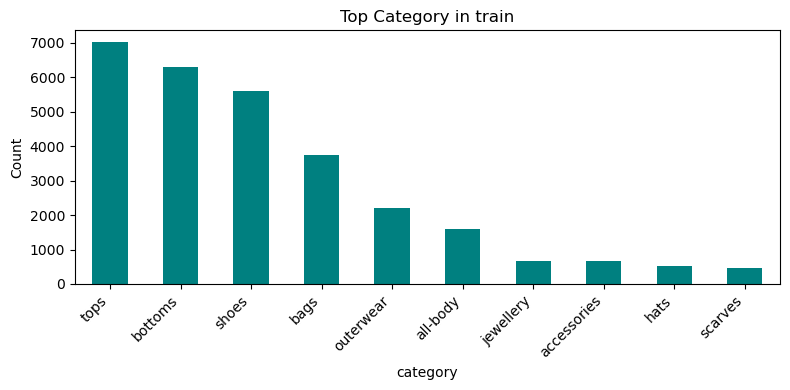

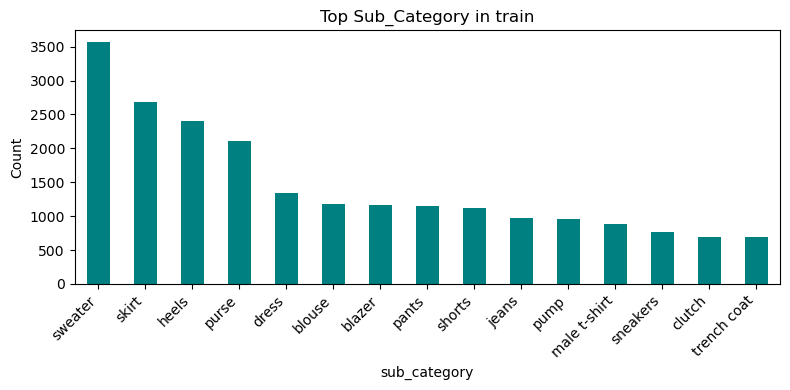


Top color (train):
black      9103
gold       2578
white      2315
blue       1535
red        1275
pink        801
denim       655
grey        547
green       493
yellow      461
navy        434
floral      417
brown       414
leather     392
striped     383
dtype: int64


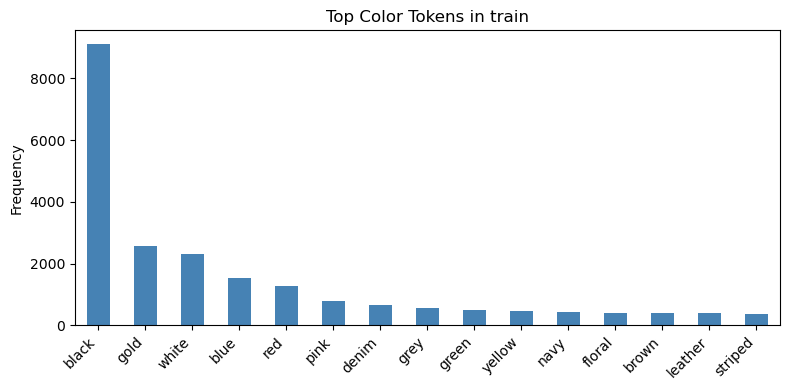


Top material (train):
leather         5275
cotton          3979
polyester       2502
silk            1997
denim           1797
suede           1295
wool            1110
elastane         998
viscose          836
faux leather     700
velvet           593
lace             554
knit             531
cashmere         515
satin            480
dtype: int64


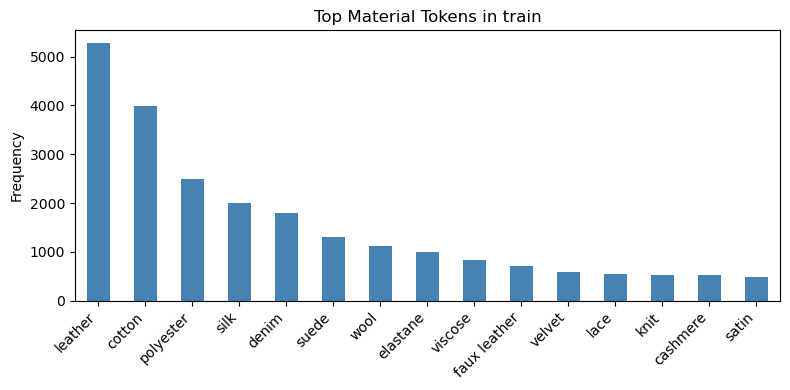


Top pattern (train):
plain          4592
striped        1502
floral          967
printed         793
embroidered     674
pleated         414
studded         345
embellished     338
distressed      334
plaid           331
lace            242
stripe          239
textured        228
quilted         206
patchwork       200
dtype: int64


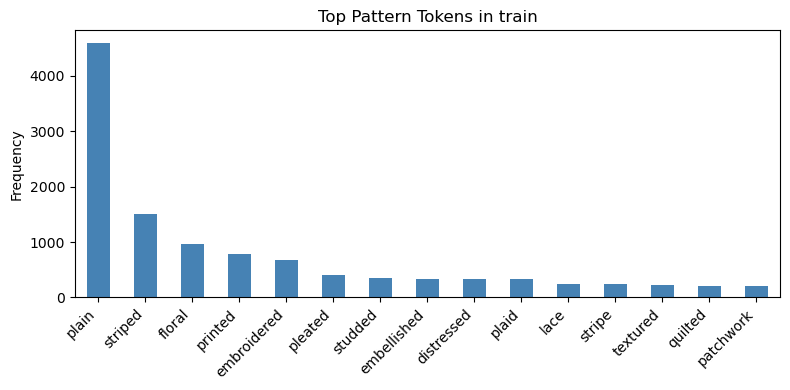

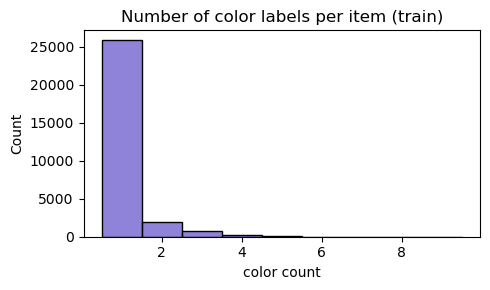

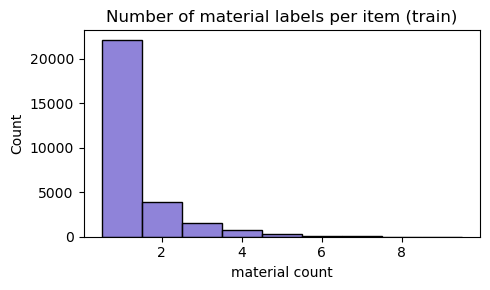

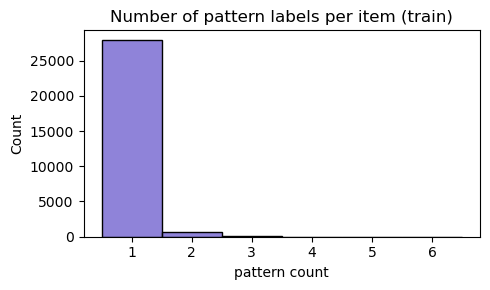


=== Summary for VALID ===
Rows: 3599
Columns: ['image_id', 'category', 'sub_category', 'color', 'material', 'pattern', 'description', 'filepath']

Missing value counts:
image_id        0
category        0
sub_category    0
color           0
material        0
pattern         0
description     0
filepath        0
dtype: int64

Duplicate image_id count: 0

Unique value counts:
category: 10 unique
sub_category: 77 unique
color: 725 unique
material: 1039 unique
pattern: 1349 unique


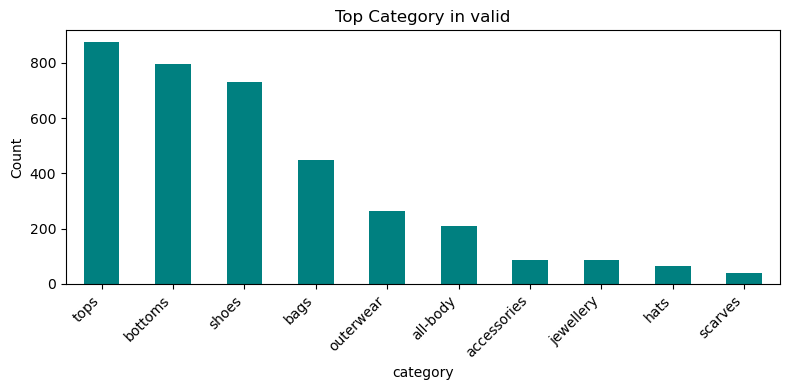

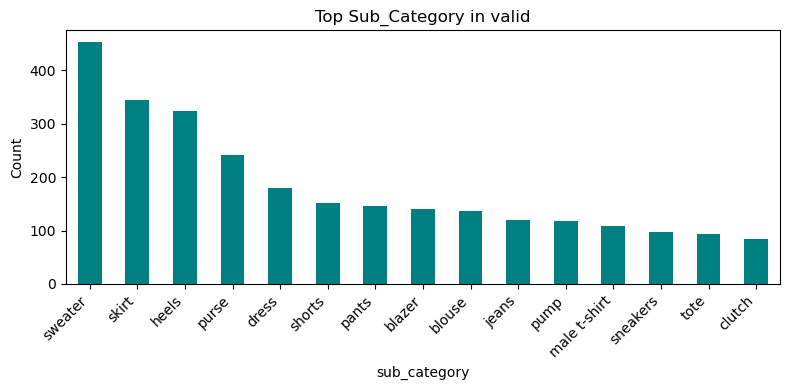


Top color (valid):
black      1199
gold        312
white       285
blue        210
red         185
pink        113
grey         79
denim        73
brown        62
yellow       61
green        56
floral       54
navy         47
cream        46
leather      45
dtype: int64


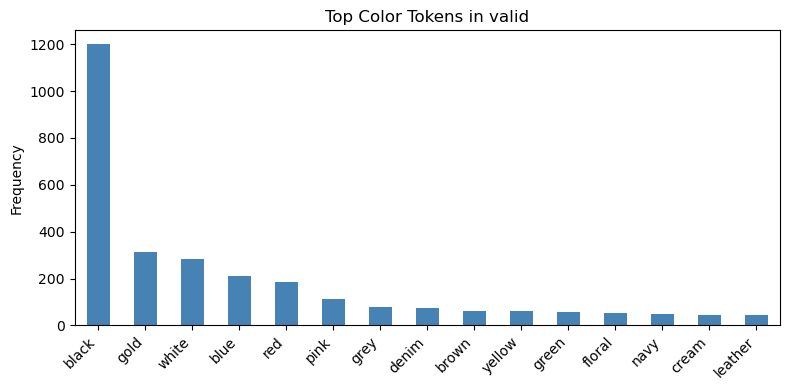


Top material (valid):
leather         692
cotton          505
polyester       315
silk            244
denim           213
suede           147
elastane        139
wool            122
viscose          92
faux leather     86
lace             75
velvet           70
pu leather       64
knit             63
rubber           62
dtype: int64


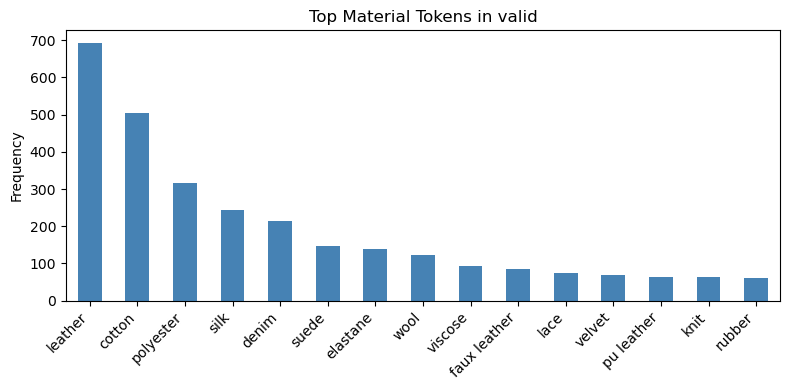


Top pattern (valid):
plain           558
striped         190
floral          133
embroidered     103
printed          97
embellished      45
pleated          43
studded          42
quilted          41
plaid            36
distressed       33
stripe           32
floral print     31
textured         29
fringed          27
dtype: int64


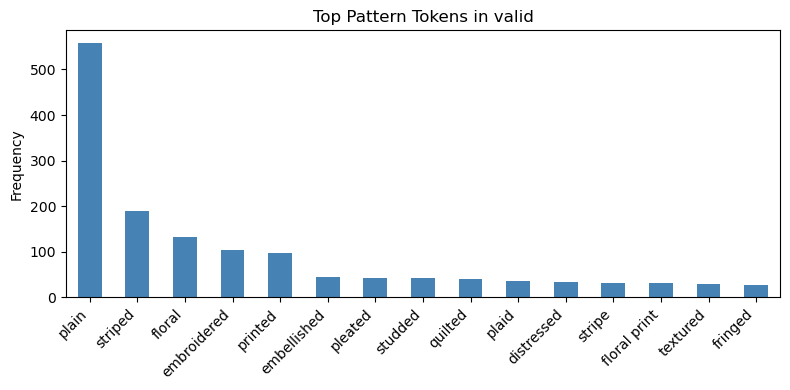

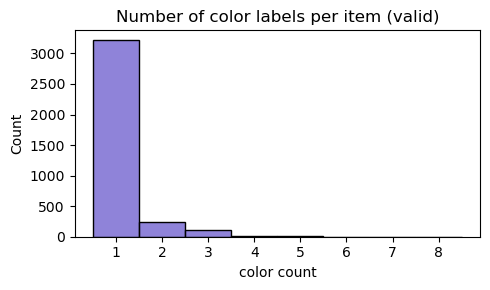

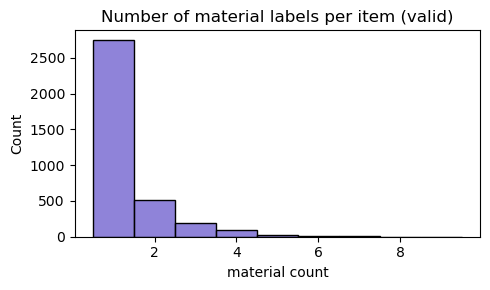

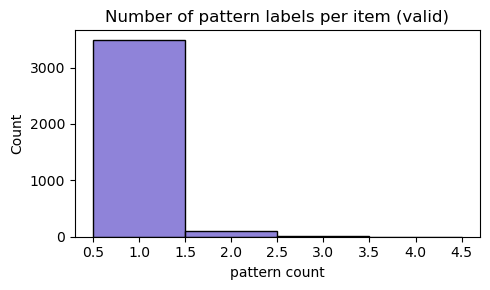


=== Summary for TEST ===
Rows: 3599
Columns: ['image_id', 'category', 'sub_category', 'color', 'material', 'pattern', 'description', 'filepath']

Missing value counts:
image_id        0
category        0
sub_category    0
color           0
material        0
pattern         0
description     0
filepath        0
dtype: int64

Duplicate image_id count: 0

Unique value counts:
category: 10 unique
sub_category: 73 unique
color: 758 unique
material: 1029 unique
pattern: 1397 unique


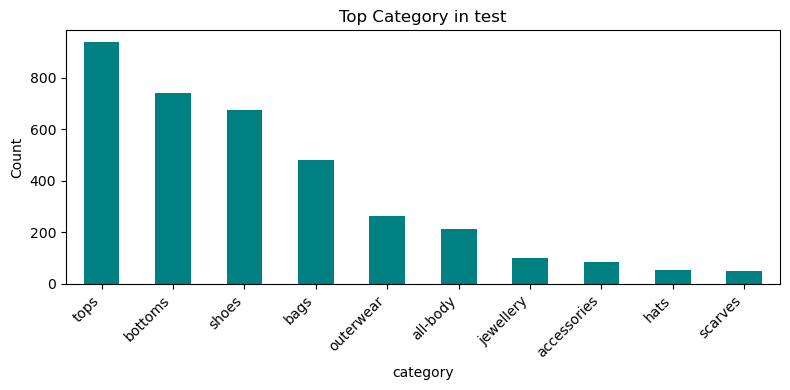

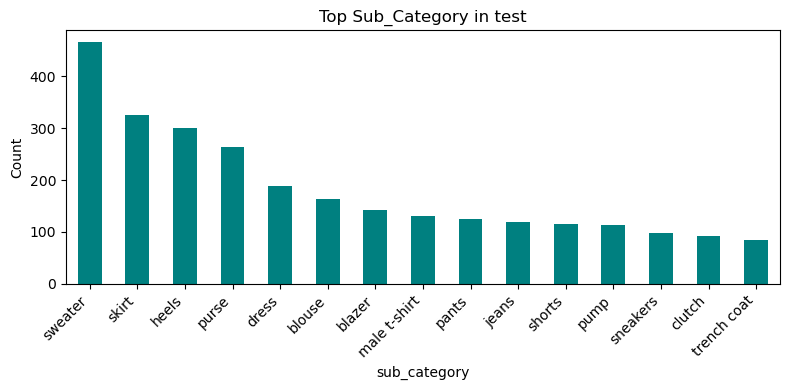


Top color (test):
black      1166
gold        370
white       301
blue        172
red         163
pink        102
denim        89
grey         74
green        70
floral       48
yellow       47
leather      47
navy         42
striped      41
brown        38
dtype: int64


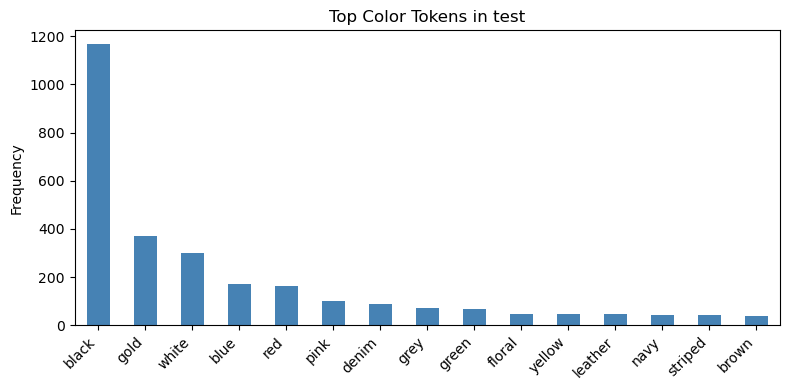


Top material (test):
leather         672
cotton          521
polyester       341
silk            254
denim           216
wool            165
suede           160
elastane        143
viscose         111
faux leather     86
velvet           82
satin            71
lace             67
pu leather       66
spandex          61
dtype: int64


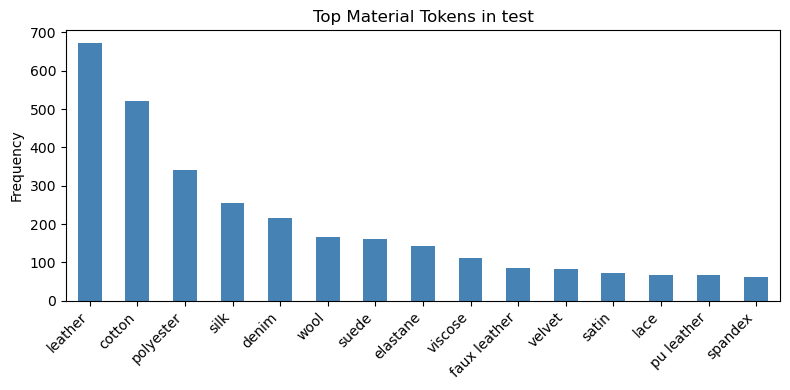


Top pattern (test):
plain           524
striped         174
floral          115
embroidered      94
printed          85
pleated          62
studded          47
embellished      43
stripe           41
lace             35
plaid            33
distressed       33
quilted          31
textured         27
floral-print     25
dtype: int64


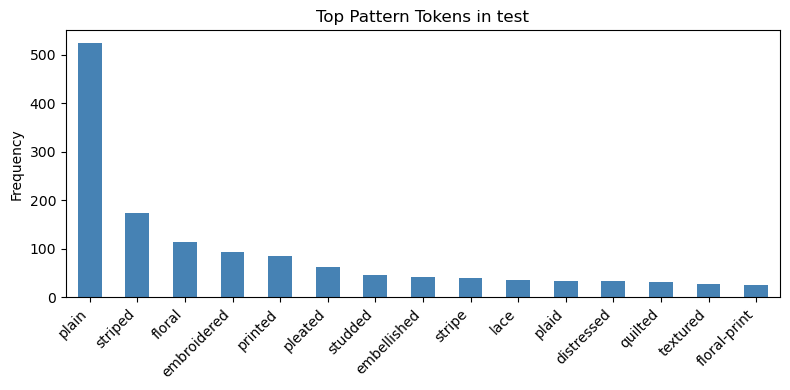

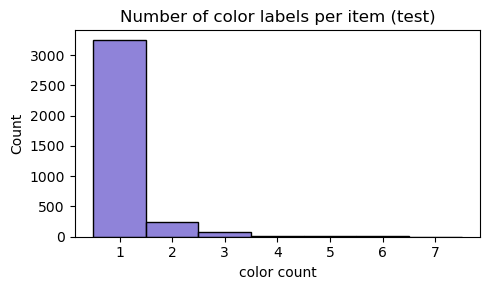

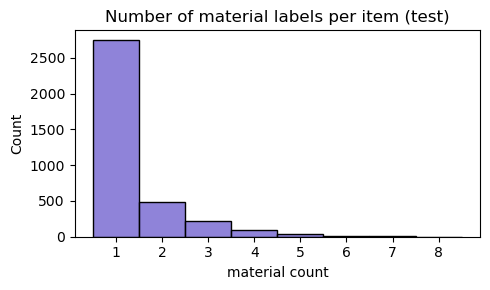

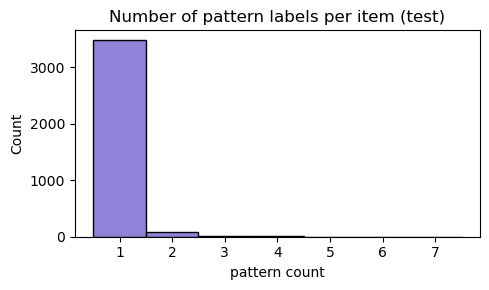

In [18]:
def split_and_flatten(series: pd.Series) -> list:
    """Split comma-separated fields into lowercase tokens."""
    values = []
    for val in series.fillna(""):
        for token in val.split(","):
            t = token.strip().lower()
            if t:
                values.append(t)
    return values

def summarize_split(df: pd.DataFrame, name: str):
    print(f"\n=== Summary for {name.upper()} ===")
    print(f"Rows: {len(df)}")
    print("Columns:", list(df.columns))
    print("\nMissing value counts:")
    print((df == "").sum())

    # Duplicate check
    dups = df["image_id"].duplicated().sum() if "image_id" in df.columns else 0
    print(f"\nDuplicate image_id count: {dups}")

    # Unique counts per field
    print("\nUnique value counts:")
    for col in ["category", "sub_category", "color", "material", "pattern"]:
        if col in df.columns:
            print(f"{col}: {df[col].nunique()} unique")

    # Basic categorical distributions
    for col in ["category", "sub_category"]:
        if col in df.columns:
            plt.figure(figsize=(8, 4))
            df[col].value_counts().head(15).plot(kind="bar", color="teal")
            plt.title(f"Top {col.title()} in {name}")
            plt.ylabel("Count")
            plt.xticks(rotation=45, ha="right")
            plt.tight_layout()
            plt.show()

    # Multi-label frequency
    for col in ["color", "material", "pattern"]:
        if col in df.columns:
            tokens = split_and_flatten(df[col])
            freq = Counter(tokens)
            freq_series = pd.Series(freq).sort_values(ascending=False)
            print(f"\nTop {col} ({name}):")
            print(freq_series.head(15))

            plt.figure(figsize=(8, 4))
            freq_series.head(15).plot(kind="bar", color="steelblue")
            plt.title(f"Top {col.title()} Tokens in {name}")
            plt.ylabel("Frequency")
            plt.xticks(rotation=45, ha="right")
            plt.tight_layout()
            plt.show()

    # Multi-label lengths
    for col in ["color", "material", "pattern"]:
        if col in df.columns:
            df[f"{col}_count"] = df[col].apply(lambda x: len([t for t in x.split(',') if t.strip()]))
            plt.figure(figsize=(5, 3))
            sns.histplot(df[f"{col}_count"], bins=range(1, df[f"{col}_count"].max()+2), color="slateblue", discrete=True)
            plt.title(f"Number of {col} labels per item ({name})")
            plt.xlabel(f"{col} count")
            plt.tight_layout()
            plt.show()

# ---------------------------------------------------------------------
# EDA for each split
# ---------------------------------------------------------------------
for name, df in split_dfs.items():
    summarize_split(df, name)

In [19]:
df_train, df_valid, df_test = split_dfs["train"], split_dfs["valid"], split_dfs["test"]

print("\n=== Cross-Split Summary ===")
print(f"Train size: {len(df_train)}  ({len(df_train)/sum(len(x) for x in split_dfs.values()):.2%})")
print(f"Valid size: {len(df_valid)}  ({len(df_valid)/sum(len(x) for x in split_dfs.values()):.2%})")
print(f"Test size:  {len(df_test)}  ({len(df_test)/sum(len(x) for x in split_dfs.values()):.2%})")

overlap_train_valid = set(df_train["image_id"]) & set(df_valid["image_id"])
overlap_train_test  = set(df_train["image_id"]) & set(df_test["image_id"])
overlap_valid_test  = set(df_valid["image_id"]) & set(df_test["image_id"])
print(f"\nOverlaps between splits:")
print(f"Train–Valid: {len(overlap_train_valid)}")
print(f"Train–Test:  {len(overlap_train_test)}")
print(f"Valid–Test:  {len(overlap_valid_test)}")

# Overall token diversity across splits
all_tokens = {}
for col in ["category", "sub_category","color", "material", "pattern"]:
    all_tokens[col] = {
    name: len(set(split_and_flatten(df[col]))) for name, df in split_dfs.items()
    }

print("\nUnique token counts per split:")
for col, stats in all_tokens.items():
    print(f"{col}: {stats}")


=== Cross-Split Summary ===
Train size: 28792  (80.00%)
Valid size: 3599  (10.00%)
Test size:  3599  (10.00%)

Overlaps between splits:
Train–Valid: 0
Train–Test:  0
Valid–Test:  0

Unique token counts per split:
category: {'train': 10, 'valid': 10, 'test': 10}
sub_category: {'train': 98, 'valid': 77, 'test': 73}
color: {'train': 2320, 'valid': 527, 'test': 568}
material: {'train': 2469, 'valid': 660, 'test': 632}
pattern: {'train': 6805, 'valid': 1373, 'test': 1437}


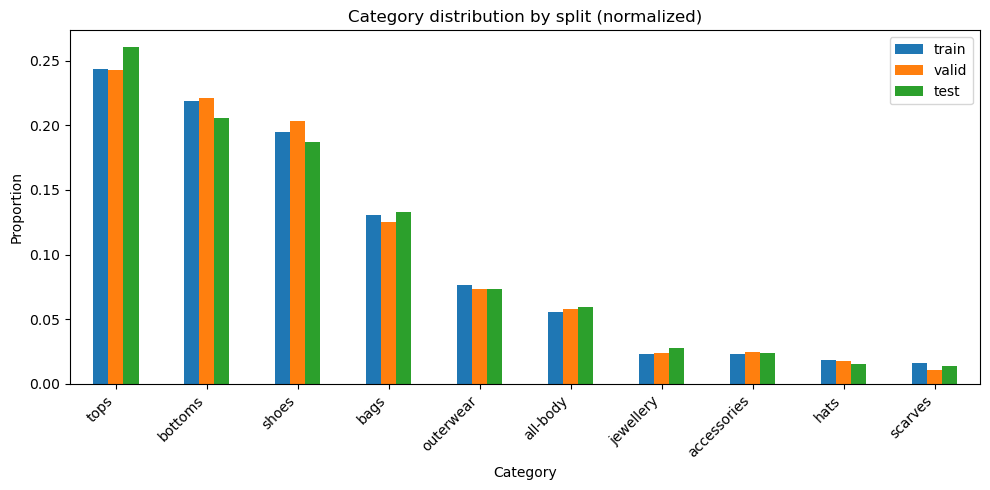

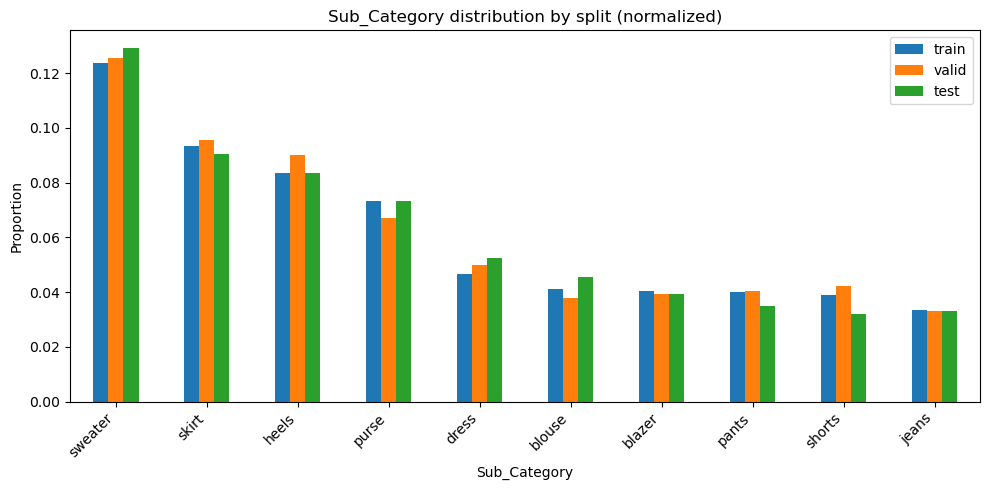

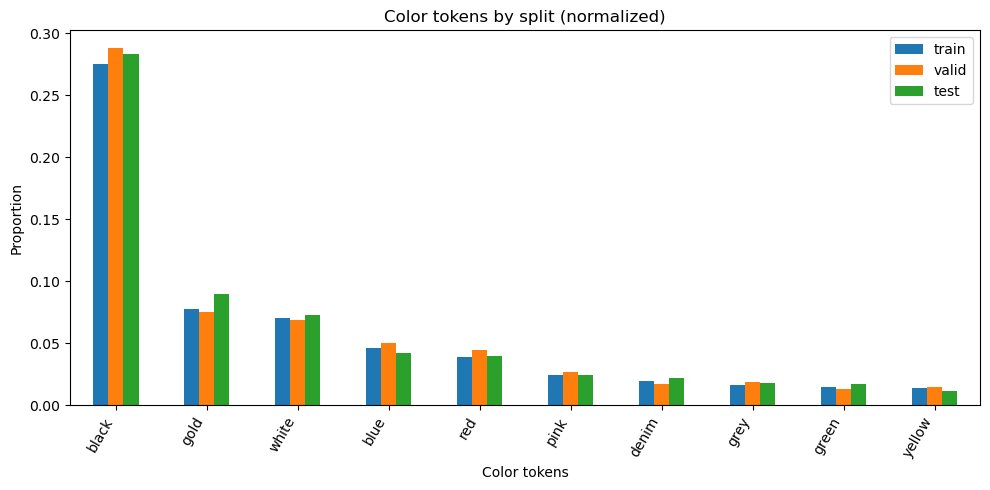

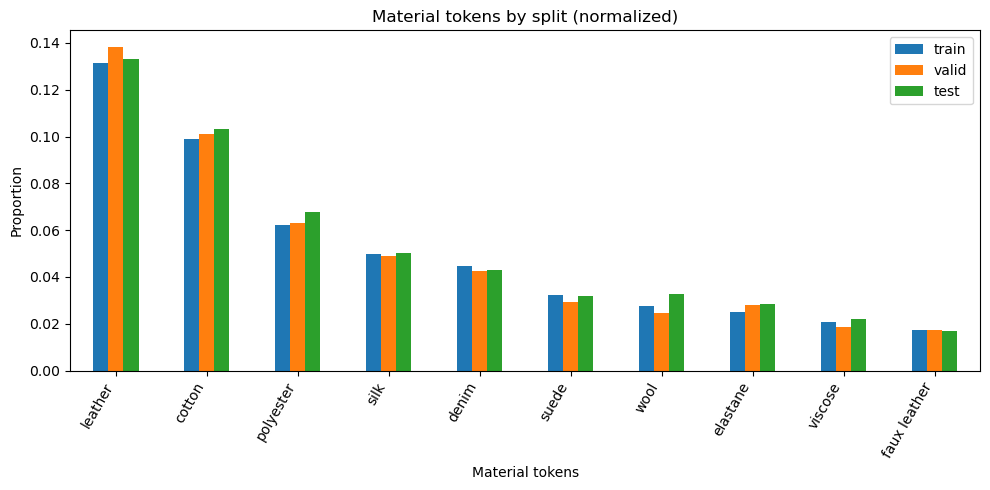

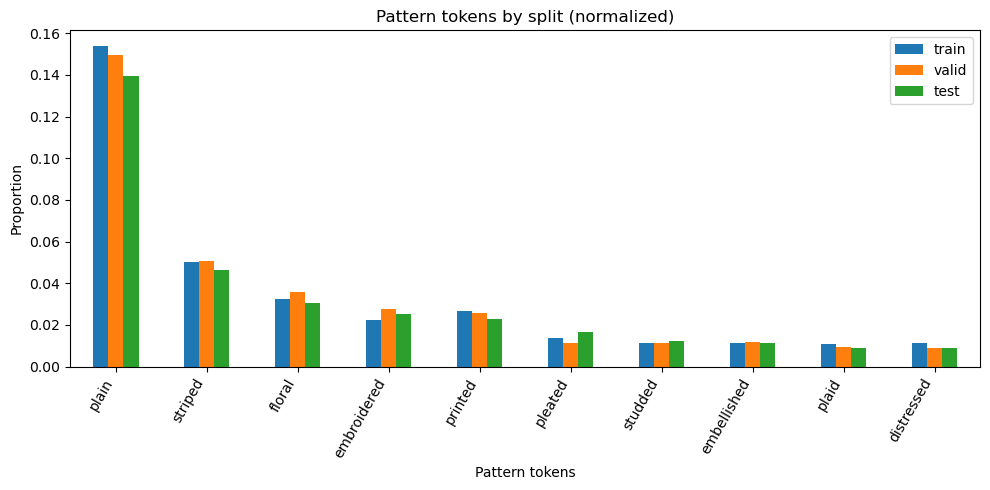

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# ------------------------------ helpers ------------------------------
def split_and_flatten(series: pd.Series) -> list:
    """Split comma-separated tokens, lowercase, and strip."""
    out = []
    for val in series.fillna(""):
        for tok in val.split(","):
            t = tok.strip().lower()
            if t:
                out.append(t)
    return out

def normalize_series(s: pd.Series) -> pd.Series:
    """Return normalized value_counts as proportions."""
    vc = s.value_counts()
    return vc / vc.sum() if vc.sum() else vc

def plot_single_label_across_splits(split_dfs: dict, col: str, top_n: int = 20, figsize=(10, 5)):
    """
    For a single-label column (e.g., category, sub_category):
    - compute normalized value_counts per split
    - outer-join them into one DataFrame
    - plot top_n by overall frequency
    """
    frames = {}
    # build normalized frequency per split
    for name, df in split_dfs.items():
        if col not in df.columns:
            continue
        # standardize text for safer comparison
        s = df[col].astype(str).str.strip().str.lower()
        frames[name] = normalize_series(s)

    if not frames:
        print(f"No data for column: {col}")
        return

    # outer join on index (labels)
    all_df = pd.DataFrame(frames).fillna(0)

    # pick top_n by total frequency across splits
    all_df["__sum__"] = all_df.sum(axis=1)
    all_df = all_df.sort_values("__sum__", ascending=False).head(top_n).drop(columns="__sum__")

    # plot
    ax = all_df.plot(kind="bar", figsize=figsize)
    ax.set_title(f"{col.title()} distribution by split (normalized)")
    ax.set_ylabel("Proportion")
    ax.set_xlabel(col.title())
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

def plot_multilabel_across_splits(split_dfs: dict, col: str, top_n: int = 30, figsize=(12, 6)):
    """
    For a multilabel column (e.g., color, material, pattern):
    - tokenize each split
    - compute normalized token frequency per split
    - align tokens across splits and plot top_n by overall frequency
    """
    frames = {}
    for name, df in split_dfs.items():
        if col not in df.columns:
            continue
        tokens = split_and_flatten(df[col])
        if len(tokens) == 0:
            frames[name] = pd.Series(dtype=float)
            continue
        cnt = Counter(tokens)
        s = pd.Series(cnt).sort_values(ascending=False)
        s = s / s.sum()  # normalize to proportions
        frames[name] = s

    if not frames:
        print(f"No data for column: {col}")
        return

    # Outer-join on token index
    all_df = pd.DataFrame(frames).fillna(0)

    # pick top_n by total across splits
    all_df["__sum__"] = all_df.sum(axis=1)
    all_df = all_df.sort_values("__sum__", ascending=False).head(top_n).drop(columns="__sum__")

    # plot
    ax = all_df.plot(kind="bar", figsize=figsize)
    ax.set_title(f"{col.title()} tokens by split (normalized)")
    ax.set_ylabel("Proportion")
    ax.set_xlabel(f"{col.title()} tokens")
    plt.xticks(rotation=60, ha="right")
    plt.tight_layout()
    plt.show()

# ------------------------------ run all plots ------------------------------
# Single-label columns
plot_single_label_across_splits(split_dfs, "category", top_n=10, figsize=(10, 5))
plot_single_label_across_splits(split_dfs, "sub_category", top_n=10, figsize=(10, 5))

# Multi-label columns
plot_multilabel_across_splits(split_dfs, "color", top_n=10, figsize=(10, 5))
plot_multilabel_across_splits(split_dfs, "material", top_n=10, figsize=(10, 5))
plot_multilabel_across_splits(split_dfs, "pattern", top_n=10, figsize=(10, 5))


# delete extra columns

In [21]:
from pathlib import Path
import pandas as pd
import shutil

base = Path("a_new_data/split")
targets = [base/"train"/"train.csv", base/"valid"/"valid.csv", base/"test"/"test.csv"]

for csv_path in targets:
    if not csv_path.exists():
        print(f"Skip (not found): {csv_path}")
        continue

    # backup once
    bak_path = csv_path.with_suffix(csv_path.suffix + ".bak")
    if not bak_path.exists():
        shutil.copy2(csv_path, bak_path)
        print(f"Backup written to: {bak_path}")

    df = pd.read_csv(csv_path, dtype=str, keep_default_na=False)
    df = df.drop(columns=[c for c in ["description", "filepath"] if c in df.columns])
    cols = ["image_id", "category", "sub_category", "color", "material", "pattern"]
    df = df[[c for c in cols if c in df.columns]]
    df.to_csv(csv_path, index=False, encoding="utf-8")
    print(f"Overwritten: {csv_path}  shape={df.shape}")

Backup written to: a_new_data\split\train\train.csv.bak
Overwritten: a_new_data\split\train\train.csv  shape=(28792, 6)
Backup written to: a_new_data\split\valid\valid.csv.bak
Overwritten: a_new_data\split\valid\valid.csv  shape=(3599, 6)
Backup written to: a_new_data\split\test\test.csv.bak
Overwritten: a_new_data\split\test\test.csv  shape=(3599, 6)
